In [1]:
google_colab = False # Turn on if running using google colab
if google_colab:
  !pip install optuna

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pylab as plt2
import numpy as np
import folium
from folium.plugins import HeatMap

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler

import optuna
import warnings

from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb

from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score

In [3]:
if google_colab:
  from google.colab import drive
  drive.mount('/content/drive')
  data = pd.read_csv("/content/drive/MyDrive/ML LAB/data.csv")

else:
  warnings.filterwarnings("ignore", message=".*No visible GPU is found.*")
  data = pd.read_csv("data.csv")

## Maabada & Mika group present

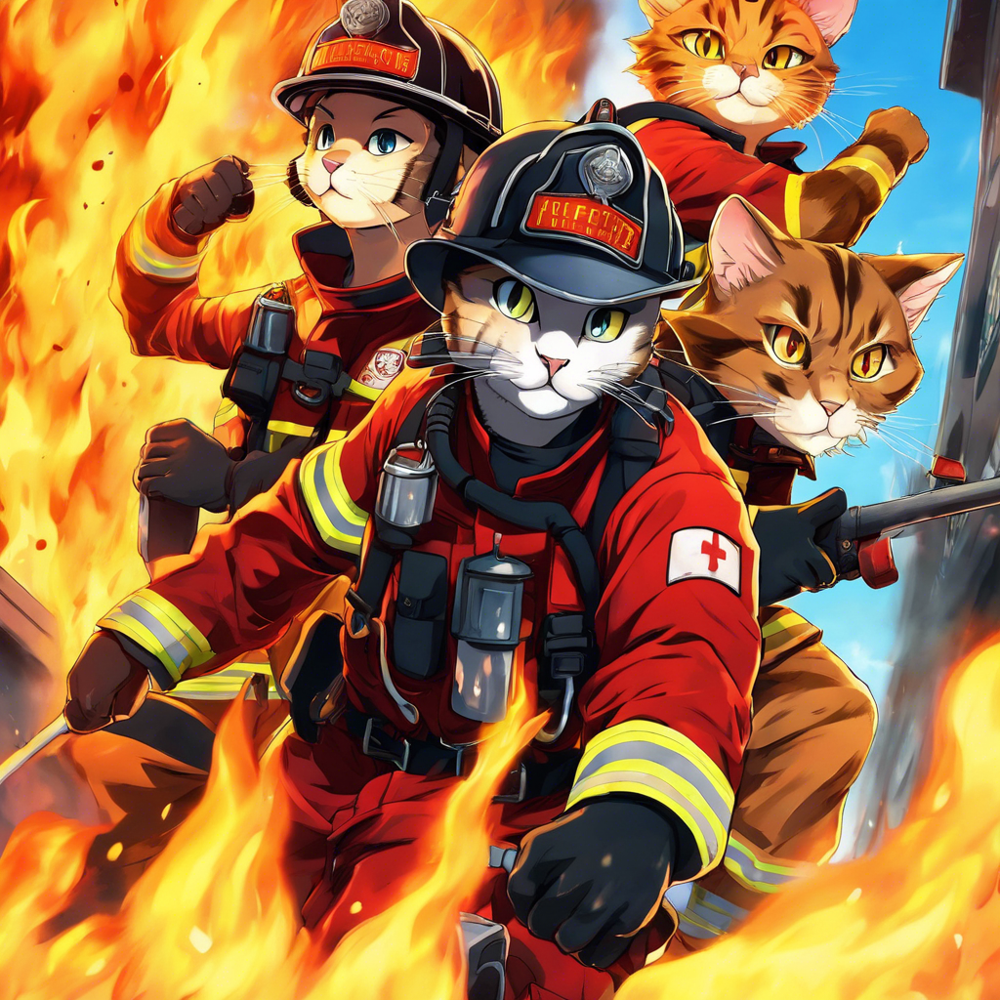

Please note: throughout the notebook some figures were added as snapshots. They are also supplied in the submission folder, if they do not load correctly in the notebook

# Data cleaning, Feature Extraction and Engineering

## Feature selection

As a first step, we drop the features that we found irrelevant to prediction. To fit the data to a specific task (such as ours), we would like to find the best features that mostly assist  in the prediction task. This data can be used for many purposes, and we would like the data to be oriented towards our prediction goal, namely the prediction of fire cause. By selecting relevant features, we focus the model on what we believe to be the most important factors that influence the target variable. This can lead to faster training, easier interpretation, and ultimately, can achieve better predictive performance.

1. ID features

In [4]:
data = data.drop(columns=["Unnamed: 0", "OBJECTID", "FOD_ID", "FPA_ID", "NWCG_REPORTING_UNIT_ID", "LOCAL_FIRE_REPORT_ID", "LOCAL_INCIDENT_ID",
                          "FIRE_CODE", "ICS_209_INCIDENT_NUMBER", "MTBS_ID", "OWNER_CODE", "FIPS_CODE"])

2. Non informative reporting source

In [5]:
data = data.drop(columns=["SOURCE_SYSTEM_TYPE", "SOURCE_SYSTEM", "NWCG_REPORTING_AGENCY"])

3. Features with too many null values for traing

In [6]:
data.isnull().sum()

NWCG_REPORTING_UNIT_NAME           0
SOURCE_REPORTING_UNIT              0
SOURCE_REPORTING_UNIT_NAME         0
FIRE_NAME                     280832
ICS_209_NAME                  563797
MTBS_FIRE_NAME                568015
COMPLEX_NAME                  569704
FIRE_YEAR                          0
DISCOVERY_DATE                     0
DISCOVERY_DOY                      0
DISCOVERY_TIME                256949
STAT_CAUSE_DESCR                   0
CONT_DATE                     265523
CONT_DOY                      265523
CONT_TIME                     284611
FIRE_SIZE                          0
FIRE_SIZE_CLASS                    0
LATITUDE                           0
LONGITUDE                          0
OWNER_DESCR                        0
STATE                              0
COUNTY                        212220
FIPS_NAME                     212220
Shape                              0
dtype: int64

In [7]:
data = data.drop(columns=["FIRE_NAME", "ICS_209_NAME",
                          "MTBS_FIRE_NAME", "COMPLEX_NAME", "DISCOVERY_TIME", "COUNTY", "FIPS_NAME"])

4. Suspected to cause leakage and have too many null values

In [8]:
data = data.drop(columns=["CONT_DATE", "CONT_DOY", "CONT_TIME"])

Note that the remaining features don't have null values

In [9]:
data.isnull().sum()

NWCG_REPORTING_UNIT_NAME      0
SOURCE_REPORTING_UNIT         0
SOURCE_REPORTING_UNIT_NAME    0
FIRE_YEAR                     0
DISCOVERY_DATE                0
DISCOVERY_DOY                 0
STAT_CAUSE_DESCR              0
FIRE_SIZE                     0
FIRE_SIZE_CLASS               0
LATITUDE                      0
LONGITUDE                     0
OWNER_DESCR                   0
STATE                         0
Shape                         0
dtype: int64

5. Non informative feature

In [10]:
data = data.drop(columns=["Shape"])

6. The example below was generated using pandas data tail and demonstrates that the 2 specific columns namely NWCG_REPORTING_UNIT_NAME and SOURCE_REPORTING_UNIT_NAME are repetative. Eyeballing the data shows the same phenomenon throughout. We refrain from showing the complete analysis due to the heavy demands on resources. The repetitive pattern led to the decision to drop the SOURCE_REPORTING_UNIT_NAME feature, which has more unique values due to capitalization or higher variation of recording the same values.

In [11]:
def get_corresponding_values(df):
  corresponding_values = dict()
  for unit_name, source_name in zip(df["NWCG_REPORTING_UNIT_NAME"], df["SOURCE_REPORTING_UNIT_NAME"]):
    if unit_name not in corresponding_values:
      corresponding_values[unit_name] = []
    corresponding_values[unit_name].append(source_name)
  return corresponding_values

corresponding_values = get_corresponding_values(data.tail())
print(corresponding_values)

{'Fire Department of New York': ['Fire Department of New York'], 'Georgia Forestry Commission': ['Georgia Forestry Commission', 'Georgia Forestry Commission'], 'San Mateo-Santa Cruz Unit': ['San Mateo-Santa Cruz Unit'], 'South Carolina Forestry Commission': ['SCS Unit 3']}


In [12]:
NWCG_REPORTING_UNIT_NAME_unique = data["NWCG_REPORTING_UNIT_NAME"].unique().size
SOURCE_REPORTING_UNIT_NAME_unique = data["SOURCE_REPORTING_UNIT_NAME"].unique().size

print(f"NWCG_REPORTING_UNIT_NAME number of unique values: {NWCG_REPORTING_UNIT_NAME_unique}")
print(f"SOURCE_REPORTING_UNIT_NAME number of unique values: {SOURCE_REPORTING_UNIT_NAME_unique}")

NWCG_REPORTING_UNIT_NAME number of unique values: 1341
SOURCE_REPORTING_UNIT_NAME number of unique values: 3611


In [13]:
data = data.drop(columns=["SOURCE_REPORTING_UNIT_NAME", "SOURCE_REPORTING_UNIT"])

## Feature classification

As a second step, we classify the remaining features as categorical\ ordinal\ continuous

1. NWCG_REPORTING_UNIT_NAME: categorical
2. FIRE_YEAR: ordinal
3. DISCOVERY_DATE: ordinal
4. DISCOVERY_DOY: ordinal
5. FIRE_SIZE: ordinal and continuous
6. FIRE_SIZE_CLASS: categorical and ordinal
7. LATITUDE: continuous
8. LONGITUDE: continuous
9. OWNER_DESCR: categorical
10. STATE: categorical

## Feature engineering

As a third step, we manipulate data features for improved prediction with the aim of easing the model prediction task, which will hopefully lead to more accurate and efficient prediction model.

1. We replace the DISCOVERY_DOY 366 unique values with 2 features using one hot endcoding. During holidays, people tend to travel and we expect different patterns of behavior, some of which may lead directly to fire hazards (e.g., smoking and campfires).

    A. Holidays when fires are more likely, namely Memorial Day, Independence Day, and Labor Day.
    We also include Halloween and New Year's Eve, even though fires are less likely then.

    These holidays map to the following days of the year:

    holidays = {
          "Memorial Day": 140 (assuming the last Monday of May),
          "Independence Day": 183,
          "Labor Day": 244 (assuming the first Monday of September),
          "Halloween": 304,
          "New Year's Eve": 365
      }

    B. All other days

In [14]:
print("DISCOVERY_DOY", ": ", sorted(data["DISCOVERY_DOY"].unique()))

DISCOVERY_DOY :  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 

In [15]:
data[f"is_holiday"] = (data["DISCOVERY_DOY"] ==  (140 or 183 or 244 or 304 or 365)).astype(int)

2. To analyze the temporal behavior of fires, we focus on seasonaity, not expecting too much difference on a month-to-month basis but rather taking into account the different nature of seasons. The season of the year can give an indication for the prediction while using only 4 values.

In [16]:
# Define season boundaries
spring_start = 63
spring_end = 155
summer_start = 156
summer_end = 248
fall_start = 249
fall_end = 340
winter1_start = 341
winter1_end = 366
winter2_start = 1
winter2_end = 62

In [17]:
# Create new columns with boolean values based on season boundaries
data['Spring'] = ((data['DISCOVERY_DOY'] >= spring_start) & (data['DISCOVERY_DOY'] <= spring_end)).astype(int)
data['Summer'] = ((data['DISCOVERY_DOY'] >= summer_start) & (data['DISCOVERY_DOY'] <= summer_end)).astype(int)
data['Fall'] = ((data['DISCOVERY_DOY'] >= fall_start) & (data['DISCOVERY_DOY'] <= fall_end)).astype(int)
data['Winter'] = ((data['DISCOVERY_DOY'] >= winter1_start) & (data['DISCOVERY_DOY'] <= winter1_end) |
                 (data['DISCOVERY_DOY'] >= winter2_start) & (data['DISCOVERY_DOY'] <= winter2_end)).astype(int)
data = data.drop(columns=['DISCOVERY_DOY'])

3. Analyzing possible causes of fires, climate can be a major factor. We therefore classify the states into areas according to the Köppen-Geiger climate classification (see, for example, https://en.wikipedia.org/wiki/Köppen_climate_classification) in order to refine our prediciton.

First, we map the state acronym to the climate classification

In [18]:
state_climate_map = {
    'AK': 'Tundra climate zone',
    'AL': 'Humid Subtropical (Hot Summer) climate zone',
    'AR': 'Humid Subtropical (Hot Summer) climate zone',
    'AZ': 'Hot Semi-Arid climate zone',
    'CA': 'Mediterranean Hot Summer climate zone',  # California has various classifications, this represents most populated areas
    'CO': 'Cold Semi-Arid climate zone',
    'CT': 'Humid Continental (Warm Summer) climate zone',
    'DC': 'Humid Continental (Hot Summer) climate zone',
    'DE': 'Humid Continental (Hot Summer) climate zone',
    'FL': 'Humid Subtropical climate zone',
    'GA': 'Humid Subtropical (Hot Summer) climate zone',
    'HI': 'Tropical Rainforest climate zone',
    'IA': 'Humid Continental (Hot Summer) climate zone',
    'ID': 'Mediterranean Hot Summer climate zone',
    'IL': 'Humid Continental (Hot Summer) climate zone',
    'IN': 'Humid Continental (Hot Summer)climate zone',
    'KS': 'Humid Continental (Hot Summer) climate zone',
    'KY': 'Humid Subtropical (Hot Summer) climate zone',
    'LA': 'Humid Subtropical (Hot Summer) climate zone',
    'MA': 'Humid Continental (Warm Summer) climate zone',
    'MD': 'Humid Continental (Hot Summer) climate zone',
    'ME': 'Humid Continental (Warm Summer) climate zone',
    'MI': 'Humid Continental (Warm Summer) climate zone',
    'MN': 'Humid Continental (Warm Summer) climate zone',
    'MO': 'Humid Continental (Hot Summer) climate zone',
    'MS': 'Humid Subtropical (Hot Summer) climate zone',
    'MT': 'Cold Semi-Arid climate zone',
    'NC': 'Humid Subtropical (Hot Summer) climate zone',
    'ND': 'Humid Continental (Warm Summer) climate zone',
    'NE': 'Humid Continental (Hot Summer) climate zone',
    'NH': 'Humid Continental (Warm Summer) climate zone',
    'NJ': 'Humid Continental (Hot Summer) climate zone',
    'NM': 'Hot Semi-Arid climate zone',
    'NV': 'BSh (Hot Desert) climate zone',
    'NY': 'Humid Continental (Hot Summer) climate zone',
    'OH': 'Humid Continental (Hot Summer) climate zone',
    'OK': 'Humid Subtropical (Hot Summer) climate zone',
    'OR': 'Marine West Coast climate zone',
    'PA': 'Humid Continental (Hot Summer) climate zone',
    'PR': 'Tropical Savanna climate zone',  # Classification based on typical climate zones
    'RI': 'Humid Continental (Warm Summer) climate zone',
    'SC': 'Humid Subtropical (Hot Summer) climate zone',
    'SD': 'Humid Continental (Warm Summer) climate zone',
    'TN': 'Humid Subtropical (Hot Summer) climate zone',
    'TX': 'Hot Semi-Arid climate zone',  # Texas has various classifications, this represents most populated areas
    'UT': 'BSh (Hot Desert) climate zone',
    'VA': 'Humid Subtropical (Hot Summer) climate zone',
    'VT': 'Humid Continental (Warm Summer) climate zone',
    'WA': 'Marine West Coast climate zone',
    'WI': 'Humid Continental (Warm Summer) climate zone',
    'WV': 'Humid Continental (Warm Summer) climate zone',
    'WY': 'Cold Semi-Arid climate zone'
}

Second, we use the Köppen-Geiger climate classification system to encode the STATE column into one-hot encoded features.

In [19]:
climate_classes = list(set(state_climate_map.values()))
for climate_type in climate_classes:
    data[climate_type] = data['STATE'].apply(lambda x: state_climate_map.get(x) == climate_type).astype(int)
data = data.drop(columns=['STATE'])

The NWCG_REPORTING_UNIT_NAME column has 1341 unique values and 528 of them include the words "Forest", "Park", or "Wild" that indicate that the fire was reported by a nature unit. These are almost 40% of the values. Thus, we will replace this column with one hot encoding columns that states whether the reporting was by a nature unit.

In [20]:
words = ["Forest", "Park", "Wild"]
filtered_data = data[data['NWCG_REPORTING_UNIT_NAME'].str.contains("|".join(words), case=False, regex=True)]
print(len(data["NWCG_REPORTING_UNIT_NAME"].unique()))
print(len(filtered_data['NWCG_REPORTING_UNIT_NAME'].unique()))
data['in_nature'] = np.where(data['NWCG_REPORTING_UNIT_NAME'].isin(filtered_data['NWCG_REPORTING_UNIT_NAME']), 1, 0)
data['not_in_nature'] = np.where(data['NWCG_REPORTING_UNIT_NAME'].isin(filtered_data['NWCG_REPORTING_UNIT_NAME']), 0, 1)
data = data.drop(columns=['NWCG_REPORTING_UNIT_NAME'])

1341
528


In [21]:
528/1341 * 100

39.37360178970917

We believe land ownership is a good proxy to separate dense from sparse inhabited areas. In the USA, areas owned by the country are typically nature reserves. Also, tribal owned areas are typically Indian reservations, thinly populated, yet an attractive vacation destinations, which may be related to fires during holiday time. 
In the OWNER_DESCR column we would like to reduce the number of classes to interesting values for the prediction. Also, FOREIGN has only 3 values so we will also add it to Other. To understand the analysis, the following acronyms are used in the data:

BIA- Bureau of Indian Affairs

BLM- Bureau of Land Management

NPS- national park service

BOR- Bureau of Reclamation

In [22]:
print("before: ")
print(data['OWNER_DESCR'].value_counts())

before: 
MISSING/NOT SPECIFIED    303921
PRIVATE                   98572
USFS                      63003
BIA                       35260
STATE OR PRIVATE          23344
BLM                       20785
STATE                      9464
NPS                        5653
FWS                        3943
TRIBAL                     2885
OTHER FEDERAL              1989
MUNICIPAL/LOCAL            1307
UNDEFINED FEDERAL           690
COUNTY                      527
BOR                          79
FOREIGN                       3
Name: OWNER_DESCR, dtype: int64


In [23]:
def replace_uncommon_titles(x):
    if x in ["MISSING/NOT SPECIFIED", "STATE OR PRIVATE", "FOREIGN"]:
        return "Other_owned"
    if x in ["USFS", "STATE", "UNDEFINED FEDERAL", "FWS", "COUNTY",
                                                    "OTHER FEDERAL", "MUNICIPAL/LOCAL", "BLM", "NPS", "BOR"]:
        return "US_owned"
    if x in ["BIA", "TRIBAL"]:
        return "Tribal_owned"
    if x in ["PRIVATE"]:
        return "Private_owned"
    return x

In [24]:
data["OWNER_DESCR"] = data["OWNER_DESCR"].apply(lambda x:replace_uncommon_titles(x))

In [25]:
print("after: ")
print(data['OWNER_DESCR'].value_counts())

after: 
Other_owned      327268
US_owned         107440
Private_owned     98572
Tribal_owned      38145
Name: OWNER_DESCR, dtype: int64


In [26]:
for owner in ["Other_owned", "US_owned", "Tribal_owned", "Private_owned"]:
    data[owner] = (data["OWNER_DESCR"] == owner).astype(int)
data = data.drop(columns=['OWNER_DESCR'])

Now, we will perform ordinal\ label encoding for FIRE_SIZE_CLASS, to reflect the increasing severity of fires.

In [27]:
encoder = OrdinalEncoder()
encoder.fit(data[["FIRE_SIZE_CLASS"]])
data["FIRE_SIZE_CLASS"] = encoder.transform(data[["FIRE_SIZE_CLASS"]]) + 1
data['{}_ordinal_encoded'.format("FIRE_SIZE_CLASS")] = data["FIRE_SIZE_CLASS"]
data.drop(columns=["FIRE_SIZE_CLASS"], inplace=True)

This concludes the data cleaning phase, and we can proceed to the data splitting phase, creating a train set and a test set

# Split train test

In [28]:
y = data["STAT_CAUSE_DESCR"]
X = data.drop(columns=["STAT_CAUSE_DESCR"])

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

A few statistics about the X_train

In [30]:
X_train.head()

,FIRE_YEAR,DISCOVERY_DATE,FIRE_SIZE,LATITUDE,LONGITUDE,is_holiday,Spring,Summer,Fall,Winter,...,Marine West Coast climate zone,Tundra climate zone,Mediterranean Hot Summer climate zone,in_nature,not_in_nature,Other_owned,US_owned,Tribal_owned,Private_owned,FIRE_SIZE_CLASS_ordinal_encoded
241295,2015,2457113.5,3.0,35.729267,-85.004333,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,2.0
399093,1993,2449153.5,4.0,35.406667,-108.453333,0,0,1,0,0,...,0,0,0,1,0,0,1,0,0,2.0
136362,2009,2455024.5,0.1,46.899867,-112.082817,0,0,1,0,0,...,0,0,0,0,1,0,1,0,0,1.0
9857,2007,2454358.5,27.0,37.093889,-101.867778,0,0,0,1,0,...,0,0,0,1,0,0,1,0,0,3.0
112587,2001,2452051.5,0.1,30.665300,-93.020600,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,1.0


In [31]:
X_train.describe()

,FIRE_YEAR,DISCOVERY_DATE,FIRE_SIZE,LATITUDE,LONGITUDE,is_holiday,Spring,Summer,Fall,Winter,...,Marine West Coast climate zone,Tundra climate zone,Mediterranean Hot Summer climate zone,in_nature,not_in_nature,Other_owned,US_owned,Tribal_owned,Private_owned,FIRE_SIZE_CLASS_ordinal_encoded
count,428568.000000,4.285680e+05,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000,...,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000,428568.000000
mean,2003.691223,2.453058e+06,72.168464,37.098165,-95.801575,0.002781,0.338037,0.334628,0.170668,0.156666,...,0.054841,0.006869,0.121778,0.686596,0.313404,0.572514,0.188087,0.067007,0.172393,1.835531
std,6.631829,2.422912e+03,2181.898073,5.782803,15.928735,0.052665,0.473042,0.471861,0.376219,0.363486,...,0.227669,0.082597,0.327029,0.463878,0.463878,0.494714,0.390782,0.250034,0.377722,0.830376
min,1992.000000,2.448622e+06,0.000010,17.939722,-173.385700,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,1998.000000,2.451128e+06,0.100000,32.869300,-110.185900,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,2004.000000,2.453104e+06,1.000000,35.608300,-92.272315,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000
75%,2009.000000,2.455034e+06,3.000000,41.031400,-82.561362,0.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000
max,2015.000000,2.457388e+06,499945.000000,70.138100,-65.285833,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


We can see below that there are classes in the y column that do not have a sufficient number of instances for the algorithm to use for effective prediction. Therefore, we combine classes to create a more balanced (smaller) set of classes.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'Debris Burning'),
  Text(1, 0, 'Miscellaneous'),
  Text(2, 0, 'Arson'),
  Text(3, 0, 'Lightning'),
  Text(4, 0, 'Equipment Use'),
  Text(5, 0, 'Campfire'),
  Text(6, 0, 'Children'),
  Text(7, 0, 'Smoking'),
  Text(8, 0, 'Railroad'),
  Text(9, 0, 'Powerline'),
  Text(10, 0, 'Fireworks'),
  Text(11, 0, 'Structure')])

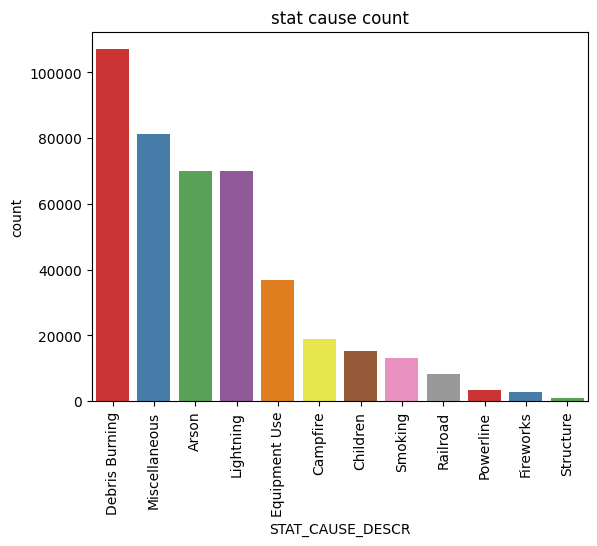

In [32]:
sns.countplot(x=y_train, order=y_train.value_counts().index, palette = "Set1").set_title('stat cause count')
plt2.xticks(rotation=90)

We add the classes of Structure, Fireworks, and Powerline to the Miscellaneous class, reducing the number of classes to 8 classes.

In [33]:
mapping = {"Structure": "Miscellaneous", "Fireworks": "Miscellaneous", "Powerline": "Miscellaneous"}
y_train = y_train.replace(mapping)
y_test = y_test.replace(mapping)

The y new classes

In [34]:
def get_colors():
    colors = {
      "Debris Burning": "red",
      "Miscellaneous": "blue",
      "Arson": "green",
      "Lightning": "purple",
      "Equipment Use": "orange",
      "Campfire": "yellow",
      "Children": "brown",
      "Smoking": "pink",
      "Railroad": "gray"
    }
    return colors

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Debris Burning'),
  Text(1, 0, 'Miscellaneous'),
  Text(2, 0, 'Arson'),
  Text(3, 0, 'Lightning'),
  Text(4, 0, 'Equipment Use'),
  Text(5, 0, 'Campfire'),
  Text(6, 0, 'Children'),
  Text(7, 0, 'Smoking'),
  Text(8, 0, 'Railroad')])

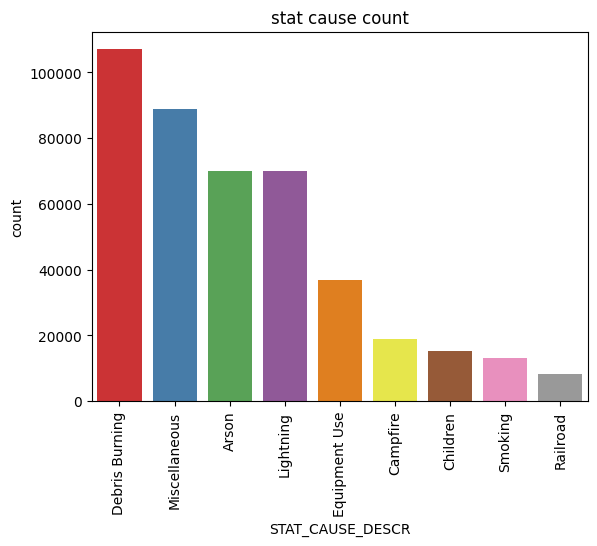

In [35]:
sns.countplot(x=y_train, order=y_train.value_counts().index, palette = "Set1").set_title('stat cause count')
plt2.xticks(rotation=90)

# Exploring and visualization

## Overall visualization

We use spatial representation of the data to gain some insights regarding our decision variable (cause of fire), and partitioning the data into holiday relevant data and other dates. The first visualization positions all train data on the US map. It is interesting to see the dominance of lightning as the cause of fires in the West, and the dominance of debris burning and arson elsewhere. In California, Equipment Use seems to be more dominant than elsewhere and Florida demonstrates a mix of fire causes.

Note that the map is slowing the computation of the notebook down so we left the code in a comment and added a snapshot of the result instead.

In [36]:
# usa_center_coords = [37.0902, -95.7129]
# m = folium.Map(location=usa_center_coords, zoom_start=4, tiles='openstreetmap')

# colors = get_colors()

# for i, (coords, cause) in enumerate(zip(list(zip(X_train['LATITUDE'], X_train['LONGITUDE'])), y_train)):
#     folium.Circle(coords, radius=20, fill=True, color=colors[cause]).add_to(m)

# means_coords = [X_train['LATITUDE'].mean(), X_train['LONGITUDE'].mean()]
# folium.Circle(means_coords, radius=50, fill=True, color="red").add_to(m)
# m

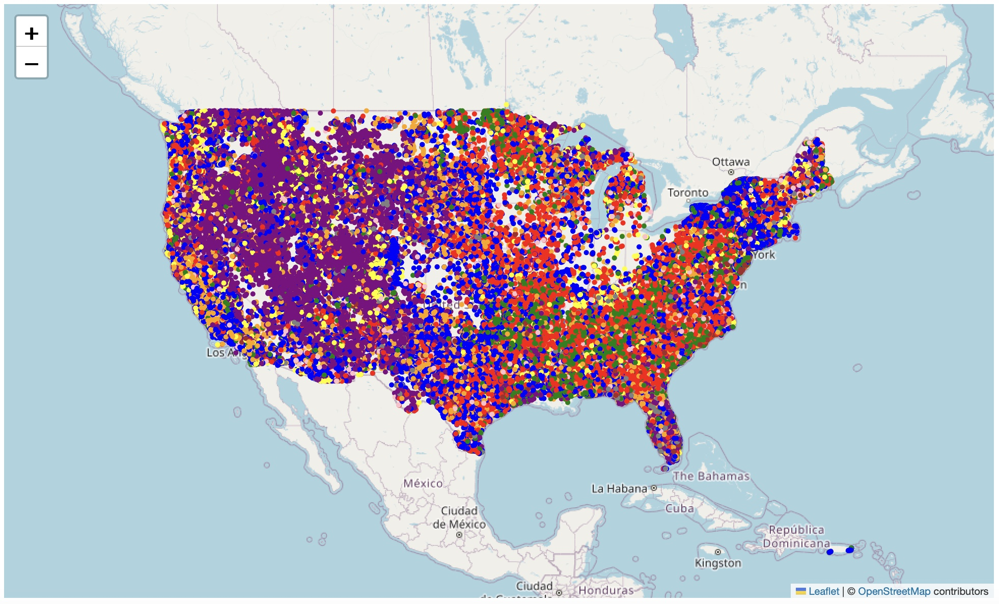

## Seasonal analysis

We investigate the most common cause for fires in each season, as the changing climates may be a factor in fire hazards. Summer time is unique with majority of fires caused by lightning.

In [37]:
def get_most_common_cause(season_data, cause_data):
  season_df = X_train[X_train[season_data] == 1]
  merged_df = season_df.merge(y_train, left_index=True, right_index=True)
  most_common_cause = merged_df['STAT_CAUSE_DESCR'].value_counts().nlargest(1).index[0]
  return most_common_cause

seasons = ['Spring', 'Summer', 'Fall', 'Winter']
common_causes = {season: get_most_common_cause(season, season) for season in seasons}

print("Most common fire cause by season:")
for season, cause in common_causes.items():
  print(f"{season}: {cause}")

Most common fire cause by season:
Spring: Debris Burning
Summer: Lightning
Fall: Debris Burning
Winter: Debris Burning


## Holiday visualization

We also count the fire cause categories during the holidays.

In [38]:
is_holiday_X_train = X_train[X_train["is_holiday"] == 1]
non_holiday_X_train = X_train[X_train["is_holiday"] == 0]

(array([0]), [Text(0, 0, '1')])

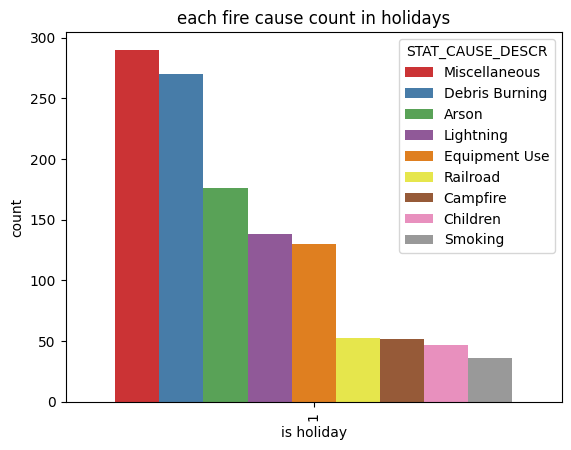

In [39]:
merged_df = is_holiday_X_train.merge(y_train, left_index=True, right_index=True)
sns.countplot(x=merged_df["is_holiday"], hue=merged_df["STAT_CAUSE_DESCR"], hue_order=merged_df["STAT_CAUSE_DESCR"].value_counts().index, palette = "Set1").set_title('each fire cause count in holidays')
plt.xlabel("is holiday")
plt2.xticks(rotation=90)

And now let's see the spatial distribution of fire events across the USA during the holidays. The highest accumulation of fires can be found in South-East USA (Florida and the Carolinas). The figure partitions fire events according to fire causes. The dominance of Debris Burning is evident in the map but no particular spatial pattern, according to fire cause, can be detected.

In [40]:
usa_center_coords = [37.0902, -95.7129]
m = folium.Map(location=usa_center_coords, zoom_start=4, tiles='openstreetmap')

colors = get_colors()

for i, (coords, cause) in enumerate(zip(list(zip(is_holiday_X_train['LATITUDE'], is_holiday_X_train['LONGITUDE'])), y_train)):
    folium.Circle(coords, radius=20, fill=True, color=colors[cause]).add_to(m)

means_coords = [is_holiday_X_train['LATITUDE'].mean(), is_holiday_X_train['LONGITUDE'].mean()]
folium.Circle(means_coords, radius=50, fill=True, color="red").add_to(m)
m

In [41]:
usa_center_coords = [35.0902, -99.7129]
m = folium.Map(location=usa_center_coords, zoom_start=4.5, tiles='openstreetmap')
HeatMap(list(zip(is_holiday_X_train['LATITUDE'],is_holiday_X_train['LONGITUDE']))).add_to(m)
m

Using a heat map, we observe that areas with dense populations like california, new york and florida have more fires in the holidays (zooming in provides a better visual analysis). 

## Non-holiday visualization

The visualization of non-holiday data surprisingly shows no difference in fire causes accross the nation.

As above, in the overrall visualization, the map is slowing the computation of the notebook down so we left the code in a comment and added a snapshot of the result instead.

In [42]:
# usa_center_coords = [37.0902, -95.7129]
# m = folium.Map(location=usa_center_coords, zoom_start=4, tiles='openstreetmap')

# colors = get_colors()

# for i, (coords, cause) in enumerate(zip(list(zip(non_holiday_X_train['LATITUDE'], non_holiday_X_train['LONGITUDE'])), y_train)):
#     folium.Circle(coords, radius=20, fill=True, color=colors[cause]).add_to(m)

# means_coords = [non_holiday_X_train['LATITUDE'].mean(), non_holiday_X_train['LONGITUDE'].mean()]
# folium.Circle(means_coords, radius=50, fill=True, color="red").add_to(m)
# m

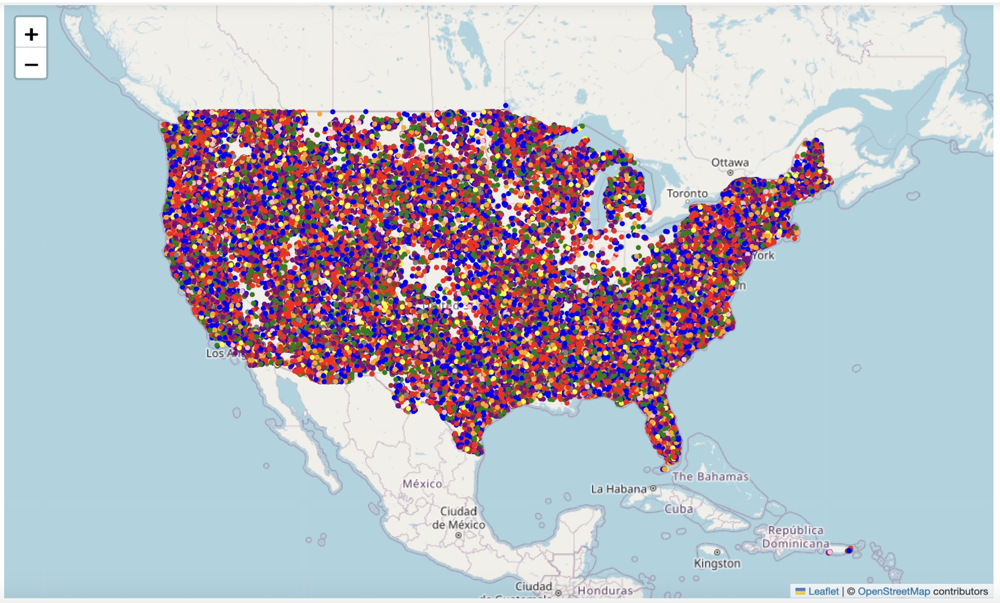

## Fire size visualization

To analyze the spatial distribution of fire sizes, we compare next the distribution of midsize fires (class 4) against large fires (classes 5-7). The specific choice of classes rely on the distribution of classes in the train data, as seen below.
The eastern part of the USA sees smaller fires than the West part. Alaska is a case in point here with dominance of large fires. This can be explained to a certain extent by the sparse population of the state and the difficulties in controlling fires in large inhabited areas.

In [43]:
print(X_train['FIRE_SIZE_CLASS_ordinal_encoded'].value_counts())

2.0    212976
1.0    153758
3.0     49637
4.0      6441
5.0      3142
6.0      1743
7.0       871
Name: FIRE_SIZE_CLASS_ordinal_encoded, dtype: int64


In [44]:
mid_big_size_X_train = X_train[X_train['FIRE_SIZE_CLASS_ordinal_encoded'].between(4, 8)]

In [45]:
def get_size_color(size_class):
  if size_class == 4:
    return "green"
  elif size_class in range(5, 8):
    return "red"

In [46]:
usa_center_coords = [48.8647, -109.0774]
m = folium.Map(location=usa_center_coords, zoom_start=3, tiles='openstreetmap')

for coords, size_class in zip(list(zip(mid_big_size_X_train['LATITUDE'], mid_big_size_X_train['LONGITUDE'])), mid_big_size_X_train['FIRE_SIZE_CLASS_ordinal_encoded']):
  color = get_size_color(size_class)
  folium.Circle(coords, radius=20, fill=True, color=color).add_to(m)
m

## Rescaling

We now rescale features. We do so for two main reasons. First, we need it for the correlation analysis Second, it assists model training.

In [47]:
def scale_data(data):
    scaler = StandardScaler()
    scaler.fit(data.select_dtypes(include=['number']))
    data_scaled = pd.DataFrame(
        scaler.transform(data.select_dtypes(include=['number'])),
        columns=data.select_dtypes(include=['number']).columns,
        index=data.index
    )
    for col in data.select_dtypes(exclude=['number']):
        data_scaled[col] = data[col]
    return data_scaled

In [48]:
X_train = scale_data(X_train)
X_test = scale_data(X_test)

After rescaling, we can check for correlations among features

<Axes: >

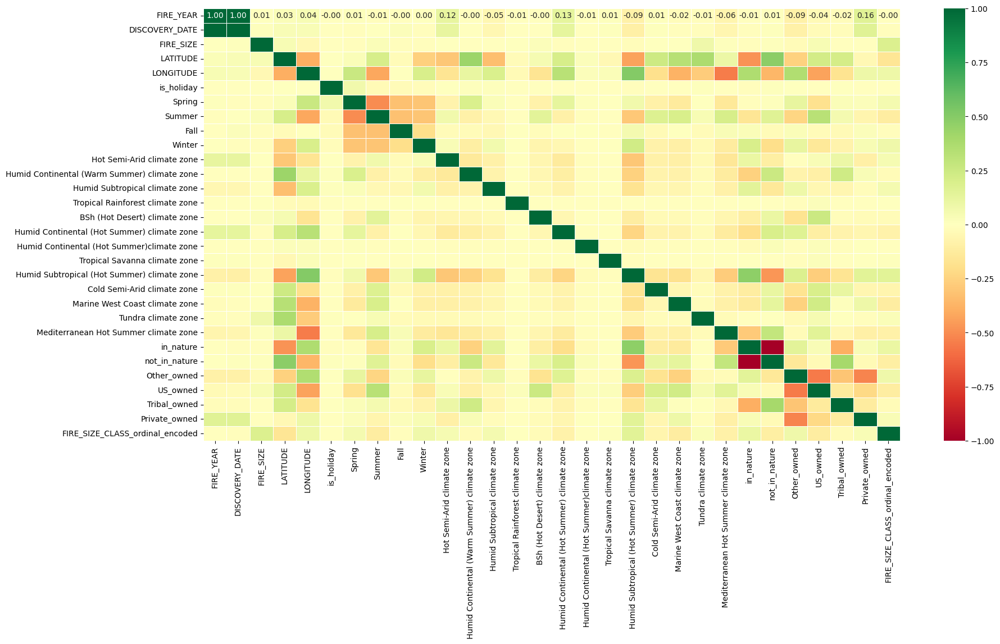

In [49]:
f,ax=plt.subplots(1,1,figsize=(20,10))
sns.heatmap(X_train.corr(), annot=True, cmap='RdYlGn', ax=ax, fmt=".2f", linewidths=.5)

A few interesting observations emerge from the heatmap.

First, there is a perfect correlation between the FIRE_YEAR and DISCOVERY_DATE features. Thus, in order to reduce the number of features used for predict, we will drop the DISCOVERY_DATE feature, which is less intuitive.

In [50]:
X_train = X_train.drop(columns=["DISCOVERY_DATE"])
X_test = X_test.drop(columns=["DISCOVERY_DATE"])

It is interesting to see the correlation between LATITUDE, LONGITUDE, and features that are location-dependent such as the Köppen-Geiger climate classification features.

Another interesting observation is that the LATITUDE, LONGITUDE features correlate with the summer and winter features. This can be explained by the fact that during summer time, the southern states, which are hotter, are more likely to suffer fire events then in the winter.

For the Random Forest model, will use ordinal\ label encoding for y.

In [51]:
y_train_reshaped = y_train.values.reshape(-1, 1)
y_test_reshaped = y_test.values.reshape(-1, 1)

encoder = OrdinalEncoder()
encoder.fit(y_train_reshaped)
y_train_encoded = encoder.transform(y_train_reshaped)
y_test_encoded = encoder.transform(y_test_reshaped)
y_train = pd.Series(y_train_encoded.flatten(), index=y_train.index)
y_test = pd.Series(y_test_encoded.flatten(), index=y_test.index)

## 

## Baseline Models

In establishing a baseline for our multi-class fire cause prediction model, We explored three machine learning algorithms: Random Forest, Decision Tree, and XGBoost. This initial approach provides a benchmark for further optimization efforts.

Firstly, both Random Forest and Decision Tree offer inherent interpretability. Their decision-making structures allow us to visualize the feature importance in predicting fire causes. This transparency is valuable as it aids in understanding the key factors influencing the models' predictions.

XGBoost, on the other hand, is a powerful Gradient Boosting model known for its accuracy and ability to capture complex relationships within data. While it might be more powerful than the other models, it might also be trickier to set up.

By evaluating all three models, we can gain valuable insights into the trade-off between interpretability and potential accuracy for our specific fire cause prediction problem.

The purpose of the code below is to establish a baseline performance for each of the three models (Random Forest, Decision Tree, and XGBoost) on the multi-class fire cause prediction problem. By calculating the weighted ROC AUC score, which is a useful metric for imbalanced multi-class problems, the code provides an initial evaluation of each model's performance.

In [52]:
rf_model = None
dt_model = None
xgb_model = None

# Random Forest Classifier Baseline
rf_model = RandomForestClassifier(random_state=0)
rf_model.fit(X_train, y_train)
y_pred_proba = rf_model.predict_proba(X_test)

weighted_roc_auc = roc_auc_score(y_test, y_pred_proba, average='weighted', multi_class='ovr')
print(f"Random Forest Classifier Baseline Weighted ROC AUC: {weighted_roc_auc}")

# Decision Tree Classifier Baseline
dt_model = DecisionTreeClassifier(random_state=0)
dt_model.fit(X_train, y_train)
y_pred_proba = dt_model.predict_proba(X_test)

weighted_roc_auc = roc_auc_score(y_test, y_pred_proba, average='weighted', multi_class='ovr')
print(f"Decision Tree Classifier Baseline Weighted ROC AUC: {weighted_roc_auc}")

# Gradient Boosting Classifier Baseline
xgb_model = xgb.XGBClassifier(random_state=0, objective='multi:softmax', tree_method='hist', device='cuda')
xgb_model.fit(X_train, y_train)
y_pred_proba = xgb_model.predict_proba(X_test)

weighted_roc_auc = roc_auc_score(y_test, y_pred_proba, average="weighted", multi_class="ovr")
print(f"XGBoost Classifier Baseline Weighted ROC AUC: {weighted_roc_auc}")


Random Forest Classifier Baseline Weighted ROC AUC: 0.812410546612145
Decision Tree Classifier Baseline Weighted ROC AUC: 0.6344834699013071
XGBoost Classifier Baseline Weighted ROC AUC: 0.7860611452581566


## Hyperparameters Optimization

The code below performs hyperparameter tuning for the three models we chose.

**Random Forest and Decision Tree**

The `rf_objective` and `dt_objective` functions define the objective functions for Random Forest and Decision Tree tuning, respectively. Optuna library is used to suggest hyperparameter values, and the models are evaluated on the test data using the weighted ROC AUC score.

The code creates Optuna studies, optimizes the models for 10 trials, prints the best trial's score and hyperparameters, and creates the models with the best hyperparameters.

**XGBoost**

For XGBoost, a grid of hyperparameters is defined, including estimators, learning rate, depth, regularization, and other parameters. The `weighted_roc_auc_scorer` function is defined as a custom scorer for the weighted ROC AUC score.

The `RandomizedSearchCV` method is used to perform a randomized search over the hyperparameter grid, using the custom scorer. The best estimator and its score and hyperparameters are printed after fitting on the training data.

After exploring the possible hyperparameter tunings, we chose to use the ones that were found to yield the best results.

**Random Forest Classifier**

For the Random Forest model, the code tunes the following hyperparameters: number of estimators (n_estimators), maximum depth of the trees (max_depth), minimum number of samples required to split an internal node (min_samples_split), minimum number of samples required to be at a leaf node (min_samples_leaf), maximum number of features to consider when looking for the best split (max_features), and whether to use bootstrap samples when building trees (bootstrap).

**Decision Tree Classifier**

In the case of the Decision Tree model, the tuned hyperparameters are: maximum depth of the tree (max_depth), minimum number of samples required to split an internal node (min_samples_split), and minimum number of samples required to be at a leaf node (min_samples_leaf).

**XGBoost Classifier**

For the XGBoost model, the code explores a grid of hyperparameters, including: number of boosting rounds (n_estimators), learning rate (learning_rate), minimum loss reduction required to split a node (gamma), maximum depth of a tree (max_depth), minimum sum of instance weight needed in a child node (min_child_weight), fraction of features and samples used for each tree (colsample_bytree and subsample), L1 and L2 regularization terms (reg_alpha and reg_lambda), and the objective function (objective).

By tuning these hyperparameters, the code aims to find the optimal configurations for each model to maximize the weighted ROC AUC score on the multi-class classification problem.

If you want to adjust the hyperparameters, you can set `tune_hyperparams` to `True` at the beginning of the next code section. However, if you don't enable that option, the code will use pre-determined best hyperparameter values that have already been found for each model. These best-performing hyperparameter values are hard-coded into the code itself. The reason for including this optional hyperparameter tuning feature is to save time.

After finding the best hyperparameters, we can fit the models with the training data.

In [53]:
tune_hyperparams = False

best_rf_hyperparams = None
best_dt_hyperparams = None
best_xgb_hyperparams = None

if tune_hyperparams:
  # optuna optimization of Random Forest Classifier
  def rf_objective(trial):
      n_estimators = trial.suggest_int('n_estimators', 2, 100)
      max_depth = int(trial.suggest_float('max_depth', 1, 32, log=True))
      min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
      min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
      max_features = trial.suggest_int('max_features', 1, len(X_train.columns))
      bootstrap = trial.suggest_categorical('bootstrap', [True, False])

      model = RandomForestClassifier(n_estimators=n_estimators,
                                      max_depth=max_depth,
                                      min_samples_split=min_samples_split,
                                      min_samples_leaf=min_samples_leaf,
                                      max_features=max_features,
                                      bootstrap=bootstrap,
                                      random_state=0)
      model.fit(X_train, y_train)
      y_pred_proba = model.predict_proba(X_test)
      weighted_roc_auc = roc_auc_score(y_test, y_pred_proba, average="weighted", multi_class="ovr")
      return weighted_roc_auc

  # optuna optimization of Decision Tree Classifier
  def dt_objective(trial):
      max_depth = trial.suggest_int('max_depth', 1, 32)
      min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
      min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)

      model = DecisionTreeClassifier(max_depth=max_depth,
                                      min_samples_split=min_samples_split,
                                      min_samples_leaf=min_samples_leaf,
                                      random_state=0)
      model.fit(X_train, y_train)
      y_pred_proba = model.predict_proba(X_test)
      weighted_roc_auc = roc_auc_score(y_test, y_pred_proba, average="weighted", multi_class="ovr")
      return weighted_roc_auc
  

  rf_study = optuna.create_study(direction='maximize')
  rf_study.optimize(rf_objective, n_trials=30)
  rf_trial = rf_study.best_trial
  # save best hyperparameters, making sure we convert to correct types
  best_rf_hyperparams = {
    k: int(v) if k != 'bootstrap' else bool(int(v))
    for k, v in rf_trial.params.items()
  }
  print('Random Forest Classifier')
  print('Weighted ROC AUC score: {}'.format(rf_trial.value))
  print("Best hyperparameters: {}".format(rf_trial.params))

  rf_model = RandomForestClassifier(n_estimators=rf_trial.params['n_estimators'],
                                        max_depth=int(rf_trial.params['max_depth']),
                                        min_samples_split=rf_trial.params['min_samples_split'],
                                        min_samples_leaf=rf_trial.params['min_samples_leaf'],
                                        max_features=rf_trial.params['max_features'],
                                        bootstrap=rf_trial.params['bootstrap'],
                                        random_state=0)
  rf_model.fit(X_train, y_train)

  dt_study = optuna.create_study(direction='maximize')
  dt_study.optimize(dt_objective, n_trials=30)
  dt_trial = dt_study.best_trial
  best_dt_hyperparams = {k: int(v) for k, v in dt_trial.params.items()}
  print('Decision Tree Classifier')
  print('Weighted ROC AUC score: {}'.format(dt_trial.value))
  print("Best hyperparameters: {}".format(dt_trial.params))

  dt_model = DecisionTreeClassifier(max_depth=dt_trial.params['max_depth'],
                                        min_samples_split=dt_trial.params['min_samples_split'],
                                        min_samples_leaf=dt_trial.params['min_samples_leaf'],
                                        random_state=0)
  dt_model.fit(X_train, y_train)

  def weighted_roc_auc_scorer(estimator, X, y):
      y_pred_proba = estimator.predict_proba(X)
      return roc_auc_score(y, y_pred_proba, average='weighted', multi_class='ovr')

  param_grid = {
      'n_estimators': [450, 500, 550],
      'learning_rate': [0.08, 0.1, 0.12],
      'gamma': [0, 0.05],
      'max_depth': [8, 10, 12],
      'min_child_weight': [3, 5, 7],
      'colsample_bytree': [0.9, 1],
      'subsample': [0.8, 0.9, 1],
      'reg_alpha': [0.05, 0.1, 0.15],
      'reg_lambda': [3, 5, 7],
      'objective': ['multi:softmax'],
      'random_state': [0],
  }

  xgb_model = xgb.XGBClassifier(objective='multi:softmax',
                                tree_method='hist',
                                verbosity=1,
                                device='cuda',
                                random_state=0)

  cv = RandomizedSearchCV(xgb_model,
                          param_grid,
                          n_iter=30,
                          cv=5,
                          verbose=2,
                          n_jobs=1,
                          scoring=weighted_roc_auc_scorer)

  cv.fit(X_train, y_train)

  xgb_model = cv.best_estimator_
  best_xgb_hyperparams = cv.best_params_
  print('XGBoost Classifier')
  print('Weighted ROC AUC score: {}'.format(cv.best_score_))
  print('Best hyperparameters: {}'.format(cv.best_params_))


else:
  best_rf_hyperparams = {
    'n_estimators': 37,
    'max_depth': 31,    
    'min_samples_split': 3,
    'min_samples_leaf': 17,
    'max_features': 23,
    'bootstrap': True,
    'random_state': 0
  }

  rf_model = RandomForestClassifier(**best_rf_hyperparams)
  rf_model.fit(X_train, y_train)
  print("Fitted Random Forest Classifier")

  best_dt_hyperparams = {
    'max_depth': 13,
    'min_samples_split': 17,
    'min_samples_leaf': 16,
    'random_state': 0
  }

  dt_model = DecisionTreeClassifier(**best_dt_hyperparams)
  dt_model.fit(X_train, y_train)
  print("Fitted Decision Tree Classifier")

  best_xgb_hyperparams = {
    'subsample': 0.9,
    'reg_lambda': 7,
    'reg_alpha': 0.15,
    'random_state': 0,
    'objective': 'multi:softmax',
    'n_estimators': 500,
    'min_child_weight': 7,
    'max_depth': 10,
    'learning_rate': 0.08,
    'gamma': 0.05,
    'colsample_bytree': 0.9
  }

  xgb_model = xgb.XGBClassifier(**best_xgb_hyperparams)
  xgb_model.fit(X_train, y_train)
  print("Fitted XGBoost Classifier")

# Best Hyperparameters for Each Model
  
# Random Forest Classifier
# Weighted ROC AUC score: 0.8372110913872671
# Best hyperparameters: {'n_estimators': 37, 'max_depth': 30.53254274654966,
# 'min_samples_split': 3, 'min_samples_leaf': 17, 'max_features': 23, 'bootstrap': True}

# Decision Tree Classifier
# Weighted ROC AUC score: 0.8032212617208687
# Best hyperparameters: {'max_depth': 13, 'min_samples_split': 17, 'min_samples_leaf': 16}

# XGBoost Classifier - Best Results After 3 iterations of Random Search
# Weighted ROC AUC score: 0.8535339919503256
# Best hyperparameters: {'subsample': 0.9, 'reg_lambda': 7, 'reg_alpha': 0.15, 'random_state': 0,
# 'objective': 'multi:softmax', 'n_estimators': 500, 'min_child_weight': 7, 'max_depth': 10,
# 'learning_rate': 0.08, 'gamma': 0.05, 'colsample_bytree': 0.9}

Fitted Random Forest Classifier
Fitted Decision Tree Classifier
Fitted XGBoost Classifier


# Evaluation

We next evaluate the models using the test set, and compare their performance.
First, we'll write a robust evaluation function that returns a wide range of metrics.
Our main metric for evaluation is the weighted ROC AUC. In addition we also look use other evaluation metrics to get a more comprehensive understanding of our model's performence.
These include: confusion matrix, classification report, balanced accuracy, and F1 score.

**Confusion Matrix:** a table showing correct predictions and types of incorrect predictions.

**Classification Report:** a text report showing the main classification metrics.

**Balanced Accuracy:** This measure treats all classes equally, calculating the average of recall scores across all classes. It works well when class imbalance is present, providing a balanced view of model performance.

**Macro F1-Score:** Similar to balanced accuracy, it averages F1-scores across all classes, accounting for both precision and recall. This metric also handles class imbalance well.

In [54]:
def evaluate_model(model, X_test, y_test):
  # Weighted ROC AUC
  y_pred_proba = model.predict_proba(X_test)
  roc_auc = roc_auc_score(y_test, y_pred_proba, average="weighted", multi_class="ovr")
  print(f"ROC AUC: {roc_auc}")

  # Balanced Accuracy and Macro F1 Score
  y_pred = model.predict(X_test)
  print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, y_pred)}")
  print(f"Macro F1 Score: {f1_score(y_test, y_pred, average='macro')}")

  # turn y_pred and y_test to class names from the label encoder,
  # and print classification report
  y_pred_reshaped = y_pred.reshape(-1, 1)
  y_test_array = y_test.values.reshape(-1, 1)
  y_pred_inverse = encoder.inverse_transform(y_pred_reshaped)
  y_test_inverse = encoder.inverse_transform(y_test_array)
  class_names = encoder.categories_[0].tolist()

  print(classification_report(y_test_inverse, y_pred_inverse, target_names=class_names))

  # plot normalized confusion matrix
  conf_mat = confusion_matrix(y_test, y_pred, normalize='true')

  plt.figure(figsize=(14, 8))
  sns.heatmap(conf_mat,
              annot=True,
              xticklabels=class_names,
              yticklabels=class_names,
              cmap='Blues')
  plt.title('Confusion Matrix of Classes')
  plt.xlabel('Predicted')
  plt.ylabel('Actual')
  plt.show()

In [55]:
# function to plot feature importance
def plot_feature_importance(model, X_test):
  feature_importance = model.feature_importances_
  feature_names = X_test.columns
  feature_importance = pd.DataFrame({"feature": feature_names, "importance": feature_importance})
  feature_importance = feature_importance.sort_values("importance", ascending=False)

  plt.figure(figsize=(10, 6))
  sns.barplot(data=feature_importance, x="importance", y="feature")
  plt.title("Feature Importance")
  plt.show()

## Random Forest Model Evaluation

ROC AUC: 0.8306904461003219
Balanced Accuracy: 0.3540757940533369
Macro F1 Score: 0.3561379033059208
                precision    recall  f1-score   support

         Arson       0.52      0.53      0.53     23216
      Campfire       0.51      0.10      0.16      6378
      Children       0.46      0.04      0.08      5086
Debris Burning       0.48      0.70      0.57     36034
 Equipment Use       0.39      0.22      0.28     12469
     Lightning       0.65      0.83      0.73     23045
 Miscellaneous       0.50      0.44      0.47     29429
      Railroad       0.47      0.32      0.38      2776
       Smoking       0.28      0.01      0.01      4424

      accuracy                           0.52    142857
     macro avg       0.47      0.35      0.36    142857
  weighted avg       0.50      0.52      0.49    142857



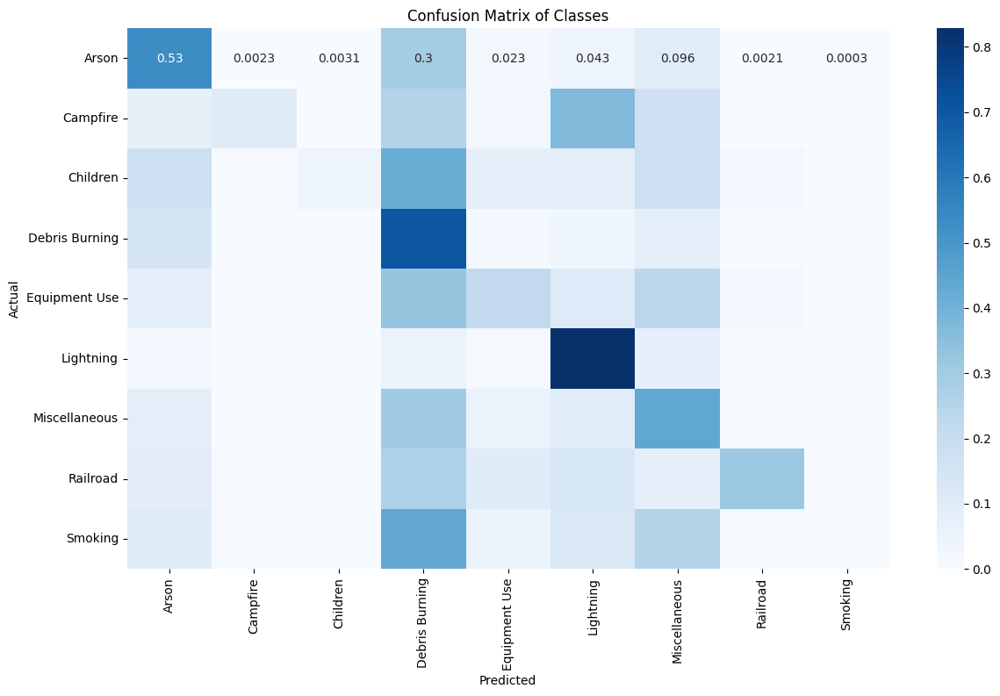

In [56]:
evaluate_model(rf_model, X_test, y_test)

Based on the evaluation metrics and the confusion matrix, it is evident that the model struggles with accurately classifying instances, particularly for the less frequent classes. The reasonable ROC AUC score  indicates that the model has some ability to discriminate between the different classes of fire causes. However, the balanced accuracy and the low macro F1 score suggest that the model's performance is suboptimal across all classes.

Examining the class-wise metrics, the model performs well in predicting the "Lightning" class, which has a relatively high instance count, achieving a high F1-score. It also shows decent performance for the prevalent classes "Debris Burning" and "Miscellaneous." However, the model severely underperforms for the rare classes like "Children," "Smoking," and "Campfire," with F1-scores near or equal to zero.

The confusion matrix further reveals the model's bias towards the more prevalent classes. The classes "Debris Burning" and "Miscellaneous" seem to act as catch-all categories, with instances from several other classes being frequently misclassified as one of them. Additionally, classes like "Arson," "Equipment Use," and "Railroad" also exhibit notable misclassification rates across multiple classes.

The weighted average F1-score being higher than the macro average confirms that the model's performance is skewed towards the more prevalent classes in the dataset. This issue is likely exacerbated by the significant class imbalance present, where rare classes like "Children," "Smoking," and "Railroad" have significantly fewer instances compared to the prevalent classes.

Overall, while the model demonstrates some ability to distinguish between fire causes, as evidenced by the ROC AUC score, it struggles with correctly classifying instances across all classes, particularly the less frequent ones. Improvements in data quality, feature engineering, or model architecture may be necessary to enhance the model's overall performance and address the class imbalance issues.

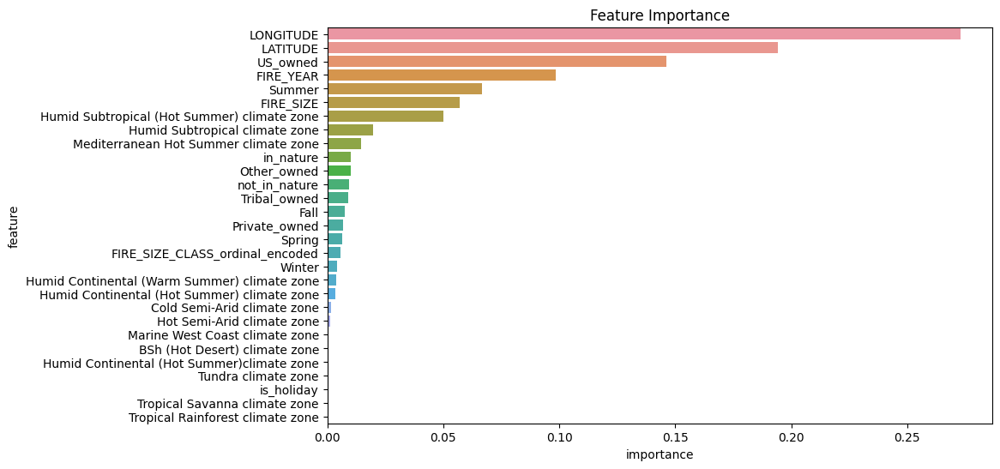

In [57]:
plot_feature_importance(rf_model, X_test)

The feature importance scores validate that the original location and timing features are the most critical factors for determining wildfire causes, as expected. However, several of the new features we engineered also have reasonably high importance scores, indicating they provide additional information to the model.

Specifically, the features indicating land ownership type (US_owned, Tribal_owned, etc.) have high importance, suggesting ownership is an influential factor. The seasonality features (Spring, Summer, Fall, Winter) also ranked highly.

Other new features we added like in_nature, not_in_nature, climate zone categories, and the FIRE_SIZE_CLASS_ordinal_encoded feature have moderate importance scores. This implies that while not as critical as location and timing, these additional features related to environment, climate conditions, and fire characteristics offer complementary predictive value.

## Desicion Tree Model Evaluation

ROC AUC: 0.7984686238253108
Balanced Accuracy: 0.34007848676803726
Macro F1 Score: 0.3391197214813746
                precision    recall  f1-score   support

         Arson       0.47      0.51      0.49     23216
      Campfire       0.22      0.10      0.14      6378
      Children       0.32      0.08      0.13      5086
Debris Burning       0.47      0.65      0.55     36034
 Equipment Use       0.35      0.17      0.23     12469
     Lightning       0.63      0.81      0.71     23045
 Miscellaneous       0.47      0.40      0.43     29429
      Railroad       0.42      0.32      0.36      2776
       Smoking       0.16      0.00      0.01      4424

      accuracy                           0.49    142857
     macro avg       0.39      0.34      0.34    142857
  weighted avg       0.46      0.49      0.46    142857



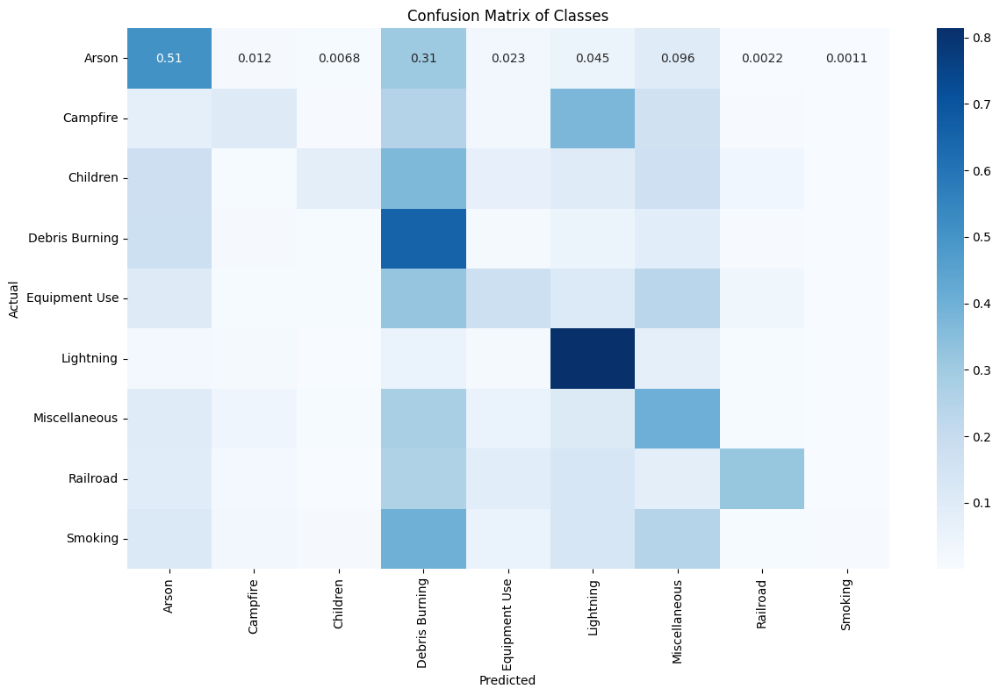

In [58]:
evaluate_model(dt_model, X_test, y_test)

The  decision tree model exhibits a decreased performance compared to the Random Forest model, with a lower ROC AUC score of 0.77 and lower macro and weighted average F1 scores. While it still performs reasonably well in predicting the "Lightning" class, its performance has declined for other classes, including prevalent ones like "Debris Burning" and "Miscellaneous."

The confusion matrix reveals the model's continued struggle with accurately classifying rare classes like "Children" and "Smoking," with most instances being misclassified. The classes "Debris Burning" and "Miscellaneous" persist as catch-all categories, with instances from several other classes frequently misclassified as one of them.

Overall, while the decision tree model demonstrates some ability to distinguish between fire causes, its performance is inferior to the Random Forest model, particularly in terms of accurately classifying instances of less frequent classes. The class imbalance issue persists, and the model remains biased towards the more prevalent classes.

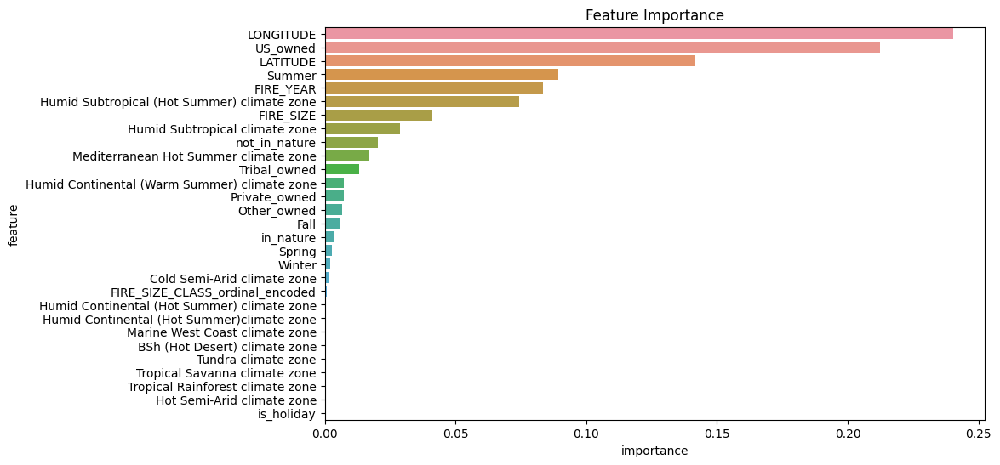

In [59]:
plot_feature_importance(dt_model, X_test)

For the Decision Tree model, we can see some similarities but also differences in the feature importance ranking compared to the random forest:

The top few most important features are still the same - LONGITUDE, LATITUDE, US_owned, and FIRE_YEAR maintain their high importance, reaffirming that location and timing are crucial factors for predicting wildfire causes regardless of model.

However, in the decision tree model, the FIRE_SIZE feature has emerged as the 5th most important, whereas it was ranked lower in the random forest. This suggests the decision tree model weighs the actual fire size more heavily as a predictive signal.

Some other noticeable differences are that seasonality features like Summer have dropped in importance ranking for the decision tree compared to random forest. Climate zone features have also become less important.

## XGBoost Model Evaluation

ROC AUC: 0.7914053643331047
Balanced Accuracy: 0.283039901441413
Macro F1 Score: 0.27148718564492236
                precision    recall  f1-score   support

         Arson       0.46      0.39      0.42     23216
      Campfire       0.29      0.03      0.06      6378
      Children       0.37      0.03      0.06      5086
Debris Burning       0.46      0.72      0.56     36034
 Equipment Use       0.39      0.12      0.18     12469
     Lightning       0.64      0.78      0.71     23045
 Miscellaneous       0.41      0.45      0.43     29429
      Railroad       0.17      0.00      0.00      2776
       Smoking       0.24      0.01      0.02      4424

      accuracy                           0.48    142857
     macro avg       0.38      0.28      0.27    142857
  weighted avg       0.45      0.48      0.43    142857



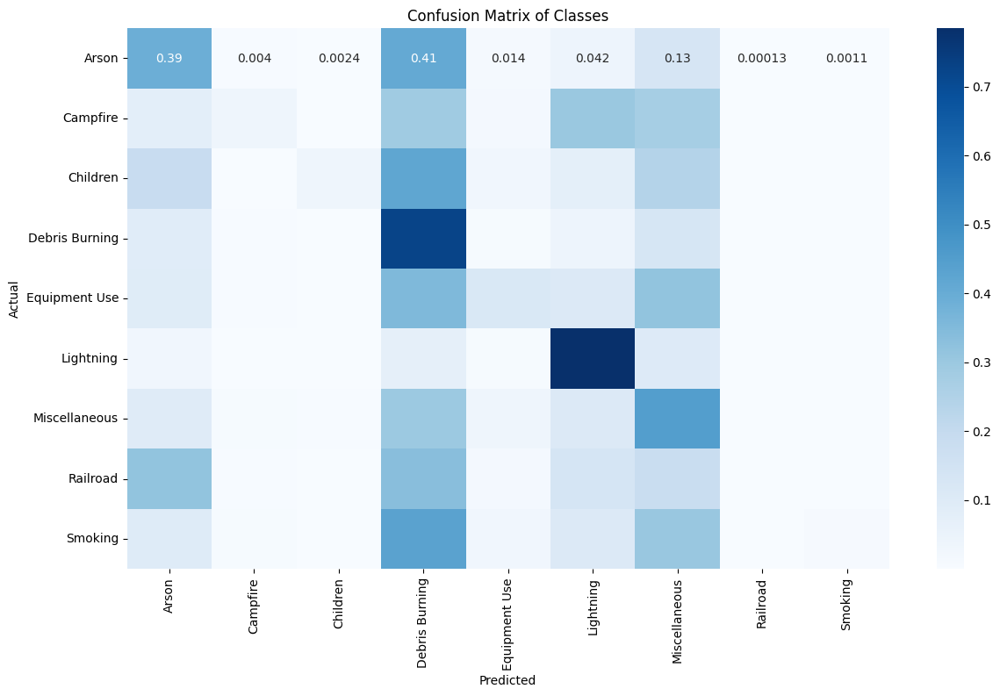

In [60]:
evaluate_model(xgb_model, X_test, y_test)

Based on the provided evaluation metrics and confusion matrix for the XGBoost model, it appears that the model's performance is relatively poor comapred to the Random Forest and Desicion Tree models, especially in handling the class imbalance problem.

The ROC AUC score indicates a reasonable ability to discriminate between the different classes of fire causes, but it is lower than the Random Forest and Desicion Tree. The balanced accuracy and the macro F1 score are quite low, suggesting that the model struggles to accurately classify instances across all classes, particularly the less frequent ones.

Examining the class-wise metrics, the model performs best in predicting the "Lightning" class, with an F1-score. However, its performance on other classes, including prevalent ones like "Debris Burning" and "Miscellaneous," is relatively poor, with F1-scores.

The confusion matrix reveals the model's severe difficulty in accurately classifying instances of rare classes like "Children," "Smoking," and "Railroad." The diagonal values for these classes are zero, indicating that the model is completely misclassifying all instances of these classes.

The classes "Debris Burning" and "Miscellaneous" continue to act as catch-all categories, with instances from several other classes being frequently misclassified as one of them. Additionally, classes like "Arson" and "Campfire" exhibit notable misclassification rates across multiple classes.

Overall, the XGBoost model underperforms compared to the Random Forest and Desicion Tree, particularly in handling the class imbalance issue and accurately classifying instances of less frequent classes. The model appears to be heavily biased towards the more prevalent classes, completely failing to correctly classify instances of rare classes.

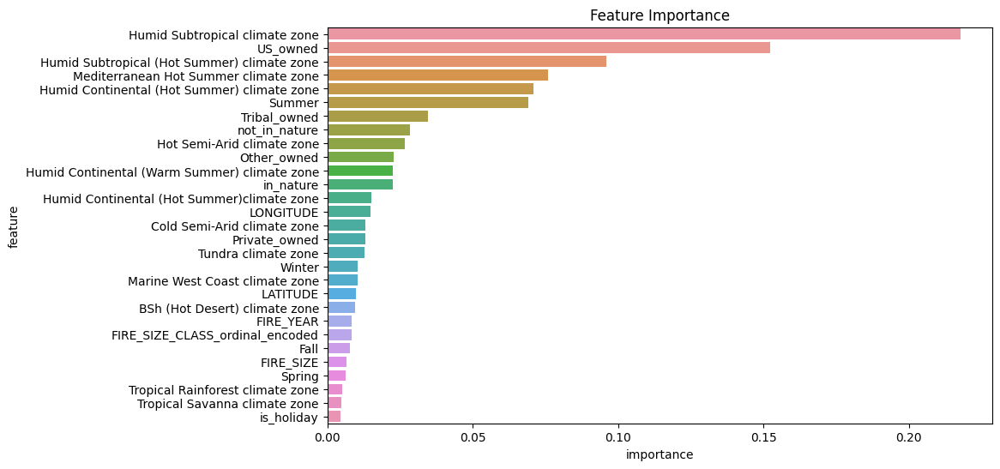

In [61]:
plot_feature_importance(xgb_model, X_test)

The XGBoost model shows some differences in which features it finds most important compared to the other models. Climate zone features like humid subtropical and humid continental hot summer are now ranked as very important, meaning XGBoost puts a lot of weight on the climate conditions when predicting wildfire causes. Land ownership remains an important factor across all models. Seasonality like summer and winter is moderately important, while features about whether the fire was in nature areas or not have become less important. Surprisingly, longitude is no longer a top feature, but latitude has gained some importance. Actual fire size features are among the least important for XGBoost.

This change highlights how the XGBoost model can focus on different signals and give higher priority to some features like climate zones, while paying less attention to others like fire size compared to single decision tree models. Seeing these kinds of differences across models provides insight into their varied approaches and strengths.

### Summary

All three wildfire prediction models agreed that location (latitude and longitude) and summer weather were crucial for predicting wildfires. However, they diverged when it came to other important factors. XGBoost highlighted specific climate zones, like "Humid Subtropical," that might be more prone to wildfires, suggesting that these zones have characteristics that make them more susceptible to fires. In contrast, Random Forest placed more importance on land ownership, particularly land owned by the US government. This could be because these lands are managed differently or located in areas more prone to wildfires. 
Interestingly, a feature we included about holidays wasn't important in any model, showing wildfires don't care if it's a barbecue weekend!

## Further Exploration

Let's try to takle the class imbalance problem by using class weights.
The code below tries to assign a lower weight to the "Debris Burning" and "Miscellaneous" classes, which are the most frequent classes in the dataset. This is done by setting the class_weight parameter to a dictionary with the class labels as keys and the corresponding weights as values. In this case, the weights for "Debris Burning" and "Miscellaneous" are set to smaller weight, while the weights for the other classes are set to 1. This means that the model will be penalized more heavily for misclassifying instances from the "Debris Burning" and "Miscellaneous" classes, encouraging it to be more cautious when predicting these classes.

*We'll use the 2 models that reached better scores for this exploration.

In [62]:
def print_conf_mat(y_test, y_pred):
  class_names = encoder.categories_[0].tolist()
  conf_mat = confusion_matrix(y_test, y_pred, normalize='true')

  plt.figure(figsize=(14, 8))
  sns.heatmap(conf_mat,
              annot=True,
              xticklabels=class_names,
              yticklabels=class_names,
              cmap='Blues')
  plt.title('Confusion Matrix of Classes')
  plt.xlabel('Predicted')
  plt.ylabel('Actual')
  plt.show()

Random Forest Classifier Weighted ROC AUC: 0.8305326647982174
Balanced Accuracy: 0.3635907702483112
Macro F1 Score: 0.362847999821318


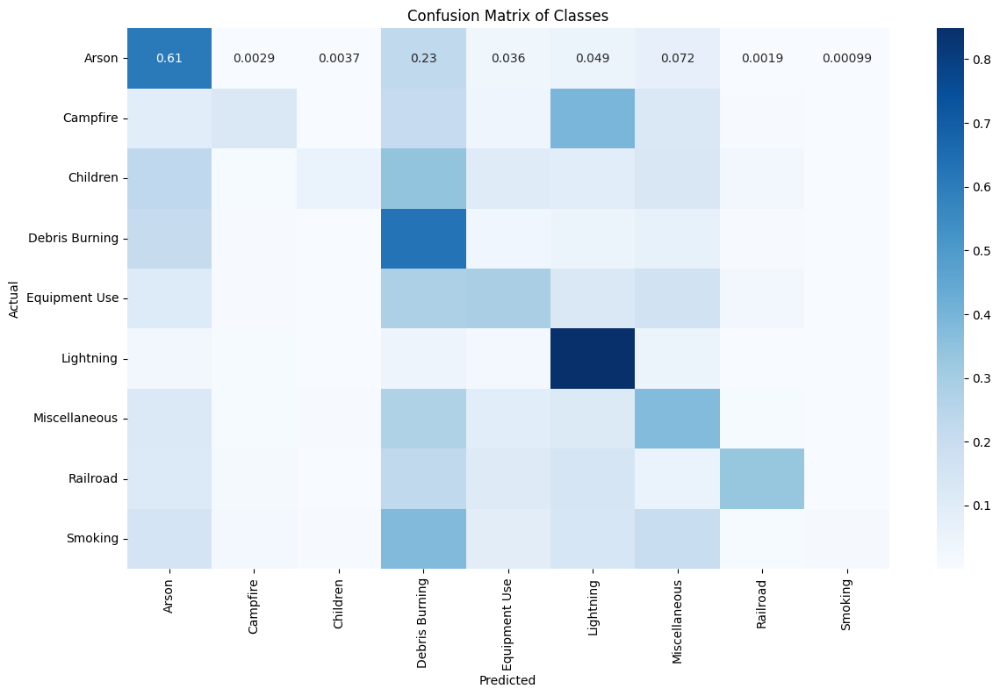

In [63]:
# find the indices of 'Debris Burning' and 'Miscellaneous' classes
categories = encoder.categories_[0].tolist()
debris_burning_index = categories.index('Debris Burning')
miscellaneous_index = categories.index('Miscellaneous')

# define the models with the best hyperparameters
rf_model = RandomForestClassifier(**best_rf_hyperparams, class_weight={debris_burning_index: 0.7, miscellaneous_index: 0.7})

# fit the models
rf_model.fit(X_train, y_train)
y_pred_proba = rf_model.predict_proba(X_test)
y_pred = rf_model.predict(X_test)
weighted_roc_auc = roc_auc_score(y_test, y_pred_proba, average='weighted', multi_class='ovr')
print(f"Random Forest Classifier Weighted ROC AUC: {weighted_roc_auc}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, y_pred)}")
print(f"Macro F1 Score: {f1_score(y_test, y_pred, average='macro')}")

print_conf_mat(y_test, y_pred)

If we examine the confusion matrix, we can see that the model is now predicting less 'Debris Burning' and 'Miscellaneous' classes correctly.
This is because we have decreased the weight of these classes in the model.
We can also see that all the other classes have improved in terms of the model's ability to predict them.
In addition, if we look at the balanced accuracy and macro F1 score, we see a slight improvement, indicating that the class weighting approach is helping to mitigate the bias towards the highly represented classes and improve the model's overall performance across all classes.

Decision Tree Classifier Weighted ROC AUC: 0.7984258504455514
Balanced Accuracy: 0.35528690960422915
Macro F1 Score: 0.34628613554054066


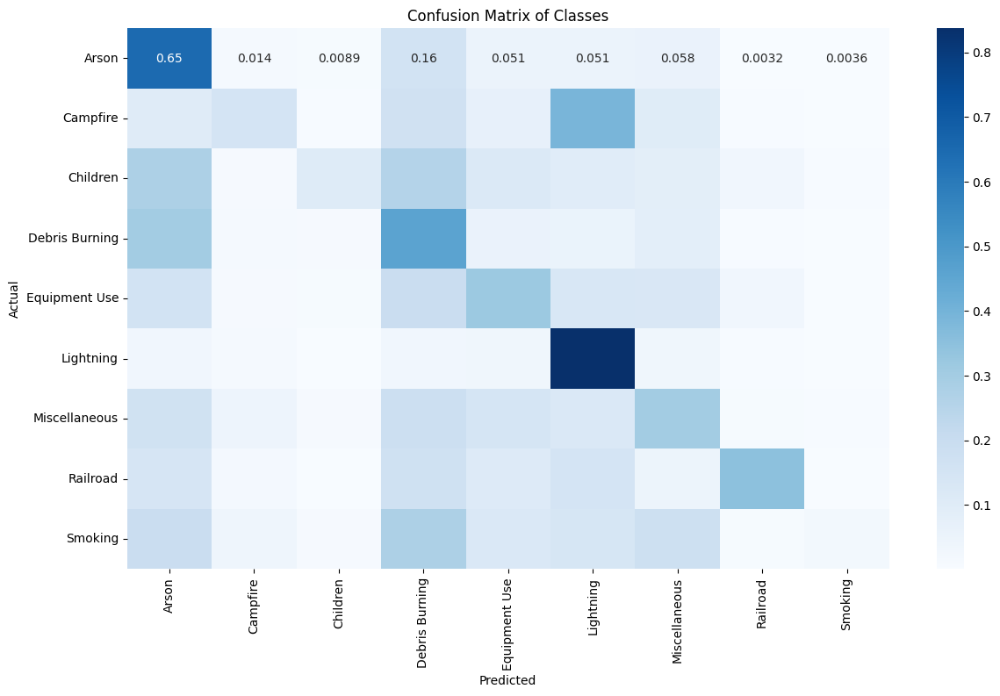

In [64]:
dt_model = DecisionTreeClassifier(**best_dt_hyperparams, class_weight={debris_burning_index: 0.5, miscellaneous_index: 0.5})

# fit the models
dt_model.fit(X_train, y_train)
y_pred_proba = dt_model.predict_proba(X_test)
y_pred = dt_model.predict(X_test)
weighted_roc_auc = roc_auc_score(y_test, y_pred_proba, average='weighted', multi_class='ovr')
print(f"Decision Tree Classifier Weighted ROC AUC: {weighted_roc_auc}")
print(f"Balanced Accuracy: {balanced_accuracy_score(y_test, y_pred)}")
print(f"Macro F1 Score: {f1_score(y_test, y_pred, average='macro')}")

print_conf_mat(y_test, y_pred)

If we examine the weighted ROC AUC, balanced accuracy, and macro F1 score and the confusion matrix,
we have reached the same conclusion as before.

The performance of the models was enhanced by adjusting the class weights, as evidenced by a slight increase in the ROC AUC score for both models. This improvement signifies that the models become better at predicting the minority classes accurately. 

**In conclusion, the Random Forest Classifier model with the best hyperparameters and adjusted class weights turned out to be the best model overall.**
 

In [65]:
pip list --format=freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.
